# <font color='navy'> <center>Classification – House Grade Prediction

### <center> By Viha Sharma

# Table of Contents

1. Import Dependencies and Dataset


2. Perform exploratory data analysis:   
    a. Dataset overview    
    b. Profile report generation    
    c. Univariate analysis   
    d. Bivariate analysis
    
    
3. Perform data preprocessing:  
    a. Check for duplicate records  
    b. Missing value treatment   
    c. Feature encoding   
    d. Correlation heatmap for feature selection   
    e. Partitioning Target and independent features   
    f. Feature scaling  
    
    
4. Model Building  
    Do StratifiedKFold splitting  
    I. Logistic Regression   
    II. Decision Trees + Hyperparameter tuning using GridSearchCV
    III. Gaussian Naive Bayes 
    IV. SVC 
    V. XGBoost + Hyperparameter tuning using GridSearchCV    
    VI. KNN Classifier
    VII. Random Forests + Hyperparameter tuning using GridSearchCV  
    VIII. Adaboost Classifier
    IX. Stacking Classifier


5. Model pipelines   
    i. Apply feature scaling    
    ii. Perform hyperparameter tuning   
    iii. Apply Pipelines to tuned Regressors  
    iv. Fit each pipeline with training data   
    v. Evaluate test accuracy of each model   
    vi. Predict the test data for each model   
    vii. Evaluate the performance of test data using accuracy score, f1 score, precision,recall 


In [1]:
# Import dependencies

import pandas as pd 
import numpy as np
import seaborn as sb
import matplotlib.pyplot as plt
from pandas_profiling import ProfileReport
import ipywidgets as widgets

from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.tree import plot_tree
from sklearn.model_selection import RepeatedStratifiedKFold,StratifiedKFold, cross_val_score, train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score

from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import StackingClassifier
from xgboost import XGBClassifier
from sklearn.pipeline import Pipeline


from sklearn import set_config
set_config(display='diagram')
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Loading Dataset

df = pd.read_csv('DS3_C6_S2_Classification_HouseGrade_Data_Project.csv'); df

,Id,Area(total),Trooms,Nbedrooms,Nbwashrooms,Twashrooms,roof,Roof(Area),Lawn(Area),Nfloors,API,ANB,Expected price,Grade
0,1,339,6,5,4,6,NO,0,76,2,79,6,3481,D
1,2,358,5,4,3,4,YES,71,96,3,72,4,3510,D
2,3,324,7,5,4,5,YES,101,117,5,64,3,3748,C
3,4,330,6,4,3,5,YES,101,82,2,59,2,3134,D
4,5,320,7,4,4,5,NO,0,75,3,40,1,3843,D
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2995,2996,341,9,6,5,7,YES,95,115,5,90,2,4246,B
2996,2997,292,9,8,7,8,YES,116,87,7,97,4,3753,A
2997,2998,328,7,4,3,5,NO,0,78,5,95,6,3607,D
2998,2999,293,9,7,7,8,NO,0,78,7,51,3,4198,B


# <font color='grey'> <center> I. Exploratory Data Analysis

In [3]:
def dataset_overview(df):
    print('\033[1;36mINITIAL DATASET OVERVIEW\033[0m')
    print('\033[1;3m1. Number of records:\033[0m',df.shape[0])
    print(' — — — — -')
    print('\033[1;3m2. Number of features:\033[0m', df.shape[1])
    print(' — — — — -')
    print('\033[1;3m3. Basic overview:\033[0m')
    print(df.info())
    print(' — — — — -')
    print('\033[1;3m4. Statistical summary:\033[0m\n',df.describe())
    print(' — — — — -')
    print('\033[1;3m5. Data types:\033[0m\n', df.dtypes)
    print(' — — — — -')
    print('\033[1;3m6. First 5 records:\033[0m\n',df.head())
    print(' — — — — -')
    print('\033[1;3m7. Last 5 records:\033[0m\n', df.tail())

In [4]:
dataset_overview(df)

INITIAL DATASET OVERVIEW
1. Number of records: 3000
 — — — — -
2. Number of features: 14
 — — — — -
3. Basic overview:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000 entries, 0 to 2999
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Id              3000 non-null   int64 
 1   Area(total)     3000 non-null   int64 
 2   Trooms          3000 non-null   int64 
 3   Nbedrooms       3000 non-null   int64 
 4   Nbwashrooms     3000 non-null   int64 
 5   Twashrooms      3000 non-null   int64 
 6   roof            3000 non-null   object
 7   Roof(Area)      3000 non-null   int64 
 8   Lawn(Area)      3000 non-null   int64 
 9   Nfloors         3000 non-null   int64 
 10  API             3000 non-null   int64 
 11  ANB             3000 non-null   int64 
 12  Expected price  3000 non-null   int64 
 13  Grade           3000 non-null   object
dtypes: int64(12), object(2)
memory usage: 328.2+ KB
None
 — — — — -
4

# <font color='grey'> Generating a Summary Report

In [1804]:
profile = ProfileReport(df); profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
# Dropping column irrelevant for classification

df.drop(['Id'], axis=1, inplace=True)

# <font color='grey'> Extracting Numerical and Non-numerical columns

In [17]:
numerical = [x for x in df.columns if df[x].dtype != 'object']
obj = [x for x in df.columns if df[x].dtype == 'object']

In [18]:
print('Numerical Columns:\n', numerical)

Numerical Columns:
 ['Area(total)', 'Trooms', 'Nbedrooms', 'Nbwashrooms', 'Twashrooms', 'Roof(Area)', 'Lawn(Area)', 'Nfloors', 'API', 'ANB', 'Expected price']


In [19]:
print('Non-numerical Columns:\n', obj)

Non-numerical Columns:
 ['roof', 'Grade']


# <font color='grey'> Data Visualisation - Univariate Analysis

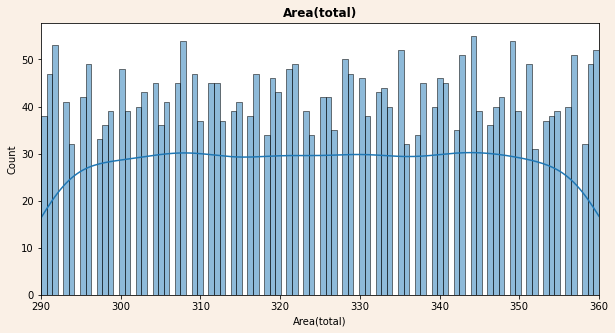

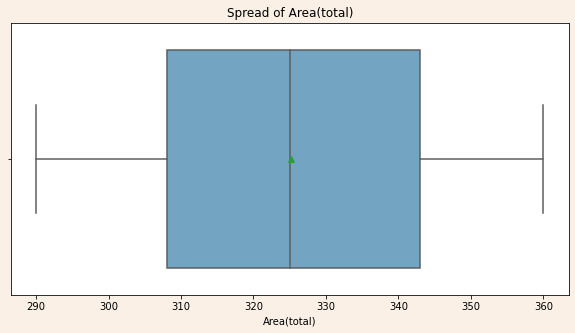

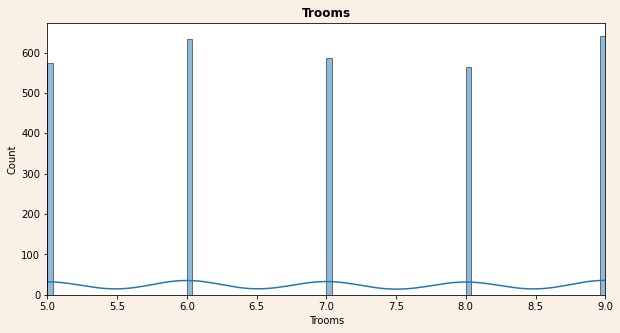

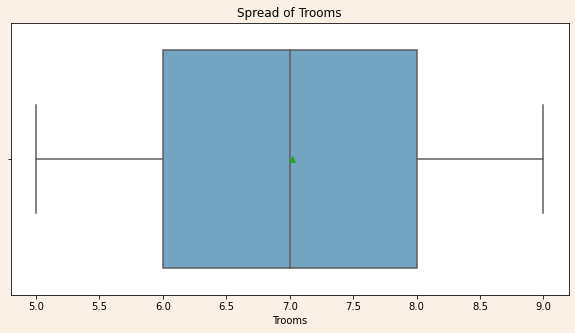

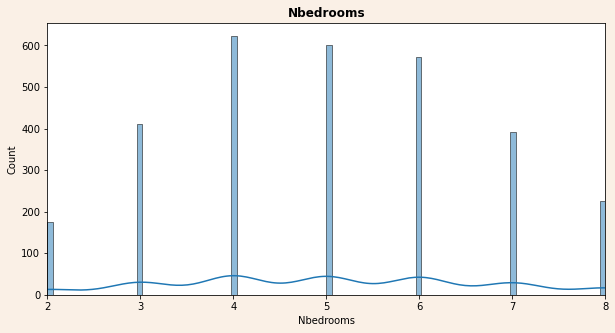

...

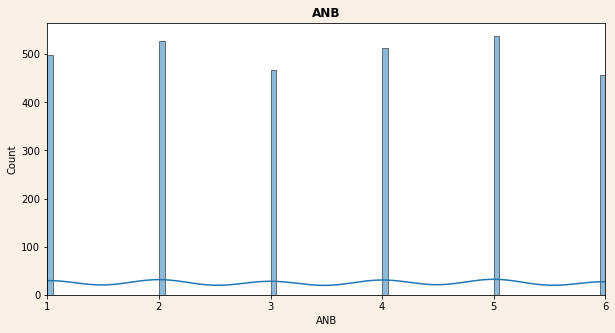

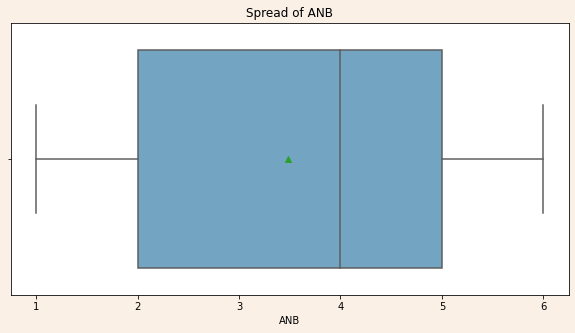

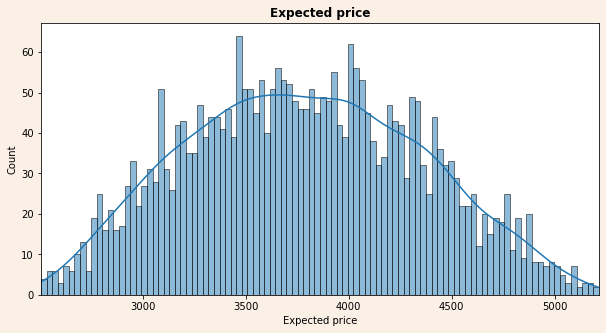

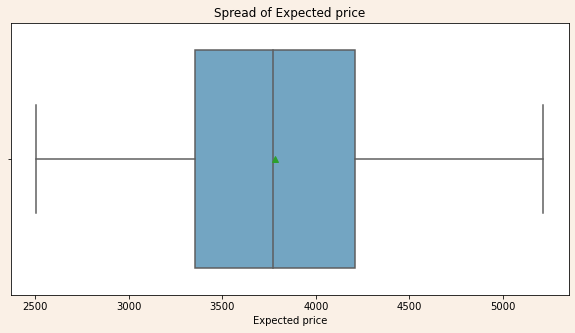

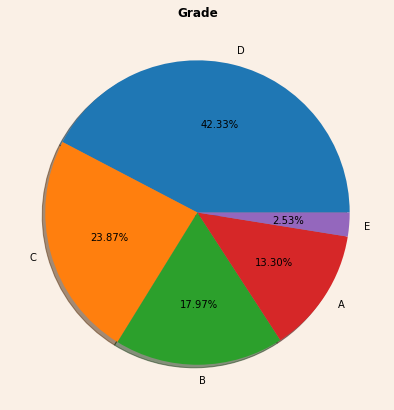

In [9]:
for i in df:    
    if i in numerical:
        plt.subplots(figsize=(10,5), facecolor='linen')
        plt.title(i, fontweight='bold')
        sb.histplot(df[i], edgecolor='black', bins=100, kde=True)
        plt.xlim(df[i].min(), df[i].max())
        plt.subplots(figsize=(10,5), facecolor='linen')
        sb.boxplot(df[i], palette='PuBuGn', showmeans=True,)
        plt.title(f'Spread of {i}')
    elif i in obj:
        plt.subplots(figsize=(15,7), facecolor='linen')
        plt.title(i, fontweight='bold')
        plt.pie(df[i].value_counts(), labels = df[i].value_counts().index, autopct = '%.2f%%', shadow=True)

# Inferences

<div class = 'alert alert-warning'>
    
1. **Area(Total) : Total area of the house**   
    The area of homes ranges from 290 to 360, and it is normally distributed
    
2. **Trooms : Number of rooms in the house**  
    The number of total bedrooms range from 5 to 9, and it is normally distributed 
    
3. **Nbedrooms : Number of bedrooms in the house**  
    These range from 2 to 8.
    
4. **Nwashrooms : Number of attached washrooms with bedroom**    
    These range from 1 to 9. The mean of this data is greater than the median, implying that the data is right skewed.
    
5. **Twashrooms : Total number of washrooms**  
    These range from 2 to 10 and the data is normally distributed.
    
6. **roof : Does the house have a roof ?**  
    Approximately half of the houses have roofs.
    
7. **Lawn(Area) : Area of the lawn**   
    Lawn area ranges from 70 to 120, with an average area of 95
    
8. **Nfloors : Total floors**   
    Floors in the homes range from 1 to 7, having 4 floors on average.
    
9. **API : Air pollution index level**  
    API ranges from 40 to 100, having an average API of 70
    
10. **ANB : Average number belonging**   
    This data is left skewed, as the mean is less than the median. ANB ranges from 1 to 6
    
11. **Expected Price: Approximate cost price of the property**   
    Ranges from 2504 to 5216, with an average home price of 3782.93
    
12. **Grade : The grade of the house/property**  
    More than 40% of homes have received a very poor grade of D. Only 13.3% of homes have received the highest home grade   of A
</div>

In [20]:
df.skew()

# All numerical features are approximately normally distributed

Area(total)      -0.003584
Trooms            0.008511
Nbedrooms         0.048713
Nbwashrooms       0.064233
Twashrooms        0.040511
Roof(Area)        0.078216
Lawn(Area)       -0.054065
Nfloors           0.001454
API              -0.012462
ANB              -0.003799
Expected price    0.090646
dtype: float64

# <font color='grey'> Bivariate Analysis

**Comparing numerical features**

In [21]:
dd1 = widgets.Dropdown(options = df, description='Column x')
dd2 = widgets.Dropdown(options=df, description='Column y')

ui = widgets.HBox([dd1,dd2], box_style='success')


In [22]:
def draw_relplot(column1, column2):
    plt.figure(figsize=(10,8), facecolor='linen')
    sb.scatterplot(df[column1],df[column2])
    plt.title(f'{column1} vs {column2}', fontweight='bold', size=20)

In [23]:
output = widgets.interactive_output(draw_relplot, {'column1': dd1, 'column2': dd2})

In [24]:
display(ui, output)

HBox(box_style='success', children=(Dropdown(description='Column x', options=('Area(total)', 'Trooms', 'Nbedro…

Output(outputs=({'output_type': 'display_data', 'data': {'text/plain': '<Figure size 720x576 with 1 Axes>', 'i…

In [25]:
df.Grade.value_counts()

D    1270
C     716
B     539
A     399
E      76
Name: Grade, dtype: int64

# MISSING VALUE TREATMENT

In [26]:
# No missing values
df.isnull().sum()

Area(total)       0
Trooms            0
Nbedrooms         0
Nbwashrooms       0
Twashrooms        0
roof              0
Roof(Area)        0
Lawn(Area)        0
Nfloors           0
API               0
ANB               0
Expected price    0
Grade             0
dtype: int64

# FEATURE ENCODING

In [27]:
encoder = LabelEncoder()

for i in df:
    if i in obj:
        df[i+'_encoded'] = encoder.fit_transform(df[i])
        df.drop(i, axis=1, inplace=True)
df.head()

,Area(total),Trooms,Nbedrooms,Nbwashrooms,Twashrooms,Roof(Area),Lawn(Area),Nfloors,API,ANB,Expected price,roof_encoded,Grade_encoded
0,339,6,5,4,6,0,76,2,79,6,3481,0,3
1,358,5,4,3,4,71,96,3,72,4,3510,1,3
2,324,7,5,4,5,101,117,5,64,3,3748,1,2
3,330,6,4,3,5,101,82,2,59,2,3134,1,3
4,320,7,4,4,5,0,75,3,40,1,3843,0,3


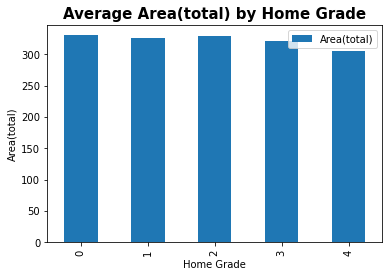

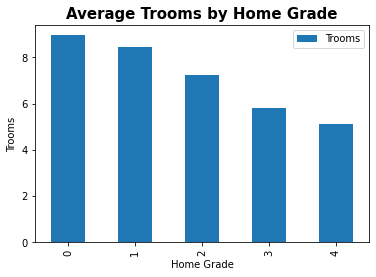

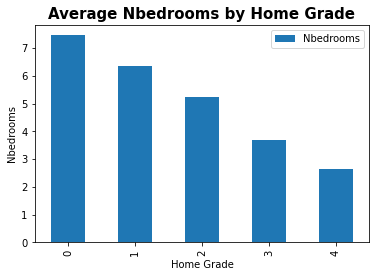

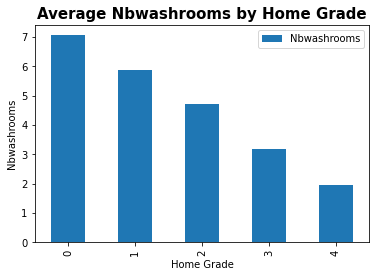

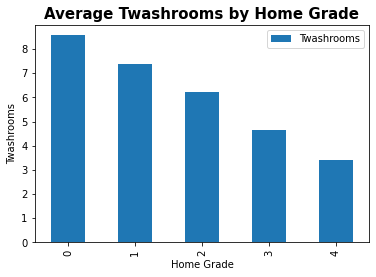

...

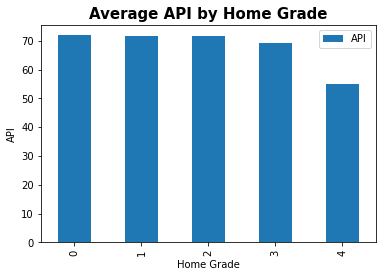

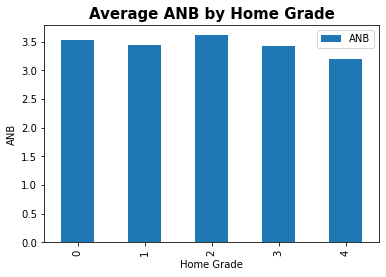

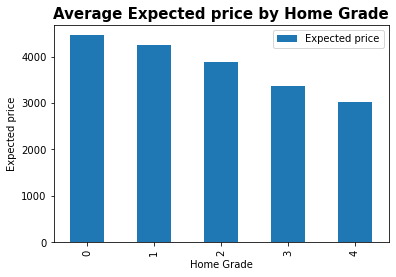

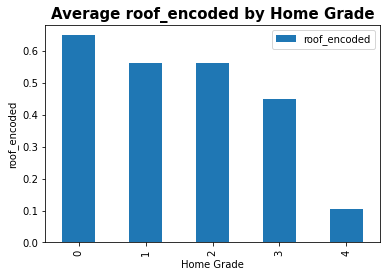

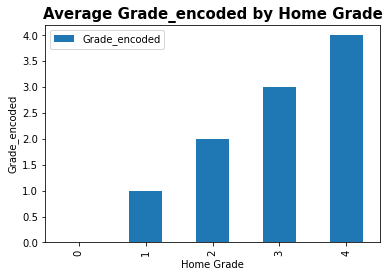

In [28]:
for i in df.columns:
    pd.DataFrame(df.groupby('Grade_encoded')[i].mean()).plot(kind='bar')
    plt.xlabel('Home Grade')
    plt.ylabel(i)
    plt.title(f'Average {i} by Home Grade', fontweight='bold', size=15)

# INFERENCES

<div class = 'alert alert-warning'>
    
1. The lowest grade houses have the least area.  
    
2. The highest grade houses have the greatest number of rooms, washrooms, expected price, and floors. 
    
3. On average, lower grade houses dont have roofs.
    
4. Grade 2 homes have the highest average ANB.      
5. The lowest grade houses tend to have the lowest API.  
     
</div>

In [29]:
X = df.drop(['Grade_encoded'],axis=1)

In [30]:
y = df['Grade_encoded']

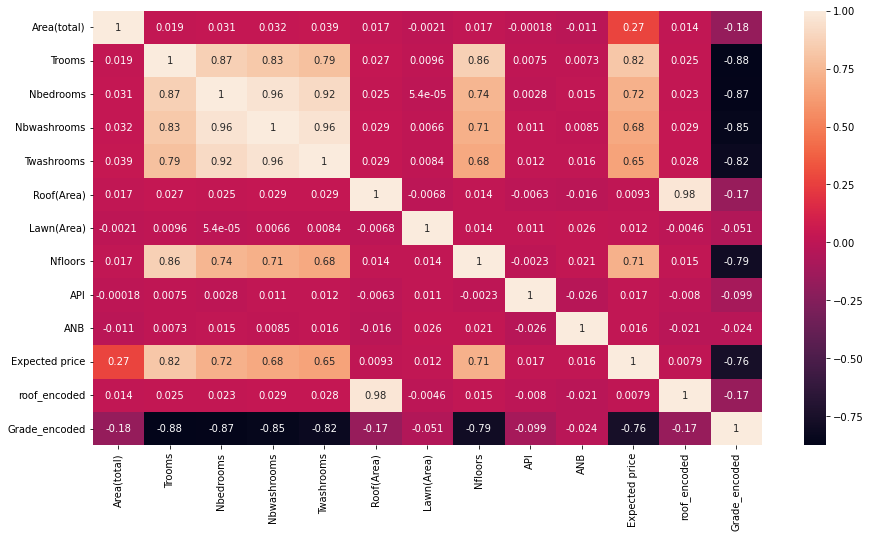

In [31]:
plt.figure(figsize=(15,8))
sb.heatmap(df.corr(), annot=True)
plt.show()

As roof_encoded and roof(area) contribute equally to the data, we will drop Roof(Area)

In [32]:
# Dropping column irrelevant for classification

df.drop(['Roof(Area)'], axis=1, inplace=True)

In [33]:
df.drop(['ANB'], axis=1, inplace=True)

In [34]:
# Correlation of features with house grade
abs(df.corr().Grade_encoded).sort_values(ascending=False)

Grade_encoded     1.000000
Trooms            0.875145
Nbedrooms         0.865389
Nbwashrooms       0.847319
Twashrooms        0.819280
Nfloors           0.787623
Expected price    0.760820
Area(total)       0.177332
roof_encoded      0.166635
API               0.099000
Lawn(Area)        0.051200
Name: Grade_encoded, dtype: float64

# SCALING X 

In [35]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=2)

In [36]:
scaler = StandardScaler()

In [37]:
X_train = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)

In [38]:
X_test = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)

# MODEL BUILDING

In [39]:
# For initial model building - without hyperparameter tuning

def clf_scores(estimator):
    clf = estimator
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    train_score = clf.score(X_train, y_train)
    print('\033[1;3mCONFUSION MATRIX\033[0m')
    print(confusion_matrix(y_test,y_pred))
    print()
    testrsq, acc, rec, f1, prec = clf.score(X_test,y_test), accuracy_score(y_test,y_pred),recall_score(y_test,y_pred, average='weighted'), f1_score(y_test,y_pred, average='weighted'), precision_score(y_test,y_pred, average='weighted')
    print('\033[1;3mSCORE OF TRAIN DATA: \033[0m', train_score)
    print('\033[1;3mSCORE OF TEST DATA: \033[0m', testrsq)
    print()
    print('\033[1;3mACCURACY OF MODEL:\033[0m', acc) #overall performance
    print('\033[1;3mRECALL/SENSITIVITY OF MODEL:\033[0m', round(rec,4)) 
    print('\033[1;3mF1 SCORE OF MODEL:\033[0m', round(f1,4))
    print('\033[1;3mPRECISION OF MODEL:\033[0m', round(prec,4))

# 1. Logistic Regression

In [40]:
clf_scores(LogisticRegression())

CONFUSION MATRIX
[[ 87   5   0   0   0]
 [  1 106   2   0   0]
 [  0  10 114   4   0]
 [  0   0   3 254   2]
 [  0   0   0   6   6]]

SCORE OF TRAIN DATA:  0.96125
SCORE OF TEST DATA:  0.945

ACCURACY OF MODEL: 0.945
RECALL/SENSITIVITY OF MODEL: 0.945
F1 SCORE OF MODEL: 0.9439
PRECISION OF MODEL: 0.9454


In [41]:
params_lr = {'C':[0.5,1,2,3,5,10],
            'penalty':['l1','l2']}

In [42]:
splits=[2,3, 4, 5,6,7,8, 9, 10,15,20,25,50]
for i in splits:
    cv = StratifiedKFold(n_splits=i,shuffle=True, random_state=None)
    print('Number of splits:', i)
    lr_score = cross_val_score(LogisticRegression(),X_train, y_train, cv=cv, scoring='accuracy', n_jobs=-1)
    print('Mean accuracy:', lr_score.mean())
    print('Standard deviation(should be low):', lr_score.std())
    print('------------')

Number of splits: 2
Mean accuracy: 0.9395833333333333
Standard deviation(should be low): 0.002083333333333326
------------
Number of splits: 3
Mean accuracy: 0.9454166666666667
Standard deviation(should be low): 0.0050346024889977355
------------
Number of splits: 4
Mean accuracy: 0.94625
Standard deviation(should be low): 0.007580585582775117
------------
Number of splits: 5
Mean accuracy: 0.9512499999999999
Standard deviation(should be low): 0.00612372435695796
------------
Number of splits: 6
Mean accuracy: 0.9516666666666667
Standard deviation(should be low): 0.010274023338281627
------------
Number of splits: 7
Mean accuracy: 0.9520838052370966
Standard deviation(should be low): 0.014605389829875942
------------
Number of splits: 8
Mean accuracy: 0.94875
Standard deviation(should be low): 0.008965597829729168
------------
Number of splits: 9
Mean accuracy: 0.9524889001530042
Standard deviation(should be low): 0.011783184295894755
------------
Number of splits: 10
Mean accuracy: 0.

In [43]:
# We should take splits = 7

In [44]:
cv = StratifiedKFold(n_splits=7,shuffle=True, random_state=None)

In [45]:
lr_grid = GridSearchCV(LogisticRegression(),param_grid= params_lr,cv= cv, verbose=1, n_jobs=-1,scoring='accuracy')

In [46]:
lr_grid.fit(X_train, y_train)

Fitting 7 folds for each of 12 candidates, totalling 84 fits


GridSearchCV(cv=StratifiedKFold(n_splits=7, random_state=None, shuffle=True),
             estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': [0.5, 1, 2, 3, 5, 10], 'penalty': ['l1', 'l2']},
             scoring='accuracy', verbose=1)

In [47]:
lr_grid.best_params_

{'C': 5, 'penalty': 'l2'}

In [48]:
# Adjusting further with penalty = L2

In [49]:
params_lr2 = {'penalty':['l2'],
                'C':[0,2,3,4,5,10],
                'solver': ['newton-cg','saga', 'sag', 'linlinear']}

In [50]:
lr_grid = GridSearchCV(LogisticRegression(),param_grid= params_lr2,cv= cv, verbose=1, n_jobs=-1,scoring='accuracy')

In [51]:
lr_grid.fit(X_train, y_train)

Fitting 7 folds for each of 24 candidates, totalling 168 fits


GridSearchCV(cv=StratifiedKFold(n_splits=7, random_state=None, shuffle=True),
             estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': [0, 2, 3, 4, 5, 10], 'penalty': ['l2'],
                         'solver': ['newton-cg', 'saga', 'sag', 'linlinear']},
             scoring='accuracy', verbose=1)

In [52]:
lr_grid.best_estimator_

LogisticRegression(C=10, solver='saga')

In [53]:
lr_grid.best_score_

0.9604221925075078

In [54]:
lr_grid.best_params_

{'C': 10, 'penalty': 'l2', 'solver': 'saga'}

# 2. Naive Bayes 

In [55]:
clf_scores(GaussianNB())

CONFUSION MATRIX
[[ 78  14   0   0   0]
 [ 11  88  10   0   0]
 [  0  28  90  10   0]
 [  0   0  32 214  13]
 [  0   0   0   5   7]]

SCORE OF TRAIN DATA:  0.8025
SCORE OF TEST DATA:  0.795

ACCURACY OF MODEL: 0.795
RECALL/SENSITIVITY OF MODEL: 0.795
F1 SCORE OF MODEL: 0.801
PRECISION OF MODEL: 0.8132


# 3. Decision trees

In [56]:
clf_scores(DecisionTreeClassifier())

CONFUSION MATRIX
[[ 77  14   1   0   0]
 [ 10  83  16   0   0]
 [  0  10 111   7   0]
 [  0   0  17 238   4]
 [  0   0   0   6   6]]

SCORE OF TRAIN DATA:  1.0
SCORE OF TEST DATA:  0.8583333333333333

ACCURACY OF MODEL: 0.8583333333333333
RECALL/SENSITIVITY OF MODEL: 0.8583
F1 SCORE OF MODEL: 0.8588
PRECISION OF MODEL: 0.8612


**Hyperparameter tuning**

In [57]:
dt_params = {'max_depth':[2,5,8,10,12, 15],
            'min_samples_split':[5,10,15,20,25,30,35],
            'max_leaf_nodes':[3,5,10,20,25,30]}

In [58]:
dt_grid = GridSearchCV(DecisionTreeClassifier(), param_grid=dt_params, cv=cv, verbose=1, n_jobs=-1)

In [59]:
dt_grid.fit(X_train,y_train)

Fitting 7 folds for each of 252 candidates, totalling 1764 fits


GridSearchCV(cv=StratifiedKFold(n_splits=7, random_state=None, shuffle=True),
             estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'max_depth': [2, 5, 8, 10, 12, 15],
                         'max_leaf_nodes': [3, 5, 10, 20, 25, 30],
                         'min_samples_split': [5, 10, 15, 20, 25, 30, 35]},
             verbose=1)

In [60]:
dt_grid.best_estimator_

DecisionTreeClassifier(max_depth=12, max_leaf_nodes=30, min_samples_split=5)

In [61]:
x = DecisionTreeClassifier(max_depth=8, max_leaf_nodes=25, min_samples_split=5).fit(X_train, y_train)

In [62]:
x.score(X_train, y_train)

0.8504166666666667

In [63]:
x.score(X_test, y_test)

0.8633333333333333

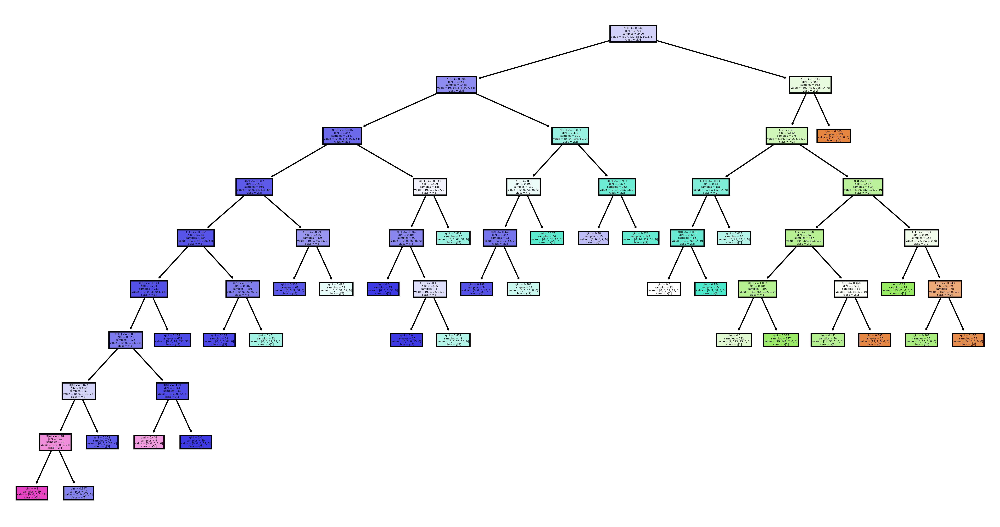

In [64]:
from sklearn import tree
fig, axes = plt.subplots(dpi=500, figsize=(15,8))
tree.plot_tree(DecisionTreeClassifier(max_depth=10, max_leaf_nodes=30, min_samples_split=5, max_features=5).fit(X_train, y_train), filled=True, class_names=True)
plt.show()
fig.savefig('classification_decisiontree.png')

# 4. Random forest classifier

In [65]:
clf_scores(RandomForestClassifier())

CONFUSION MATRIX
[[ 79  13   0   0   0]
 [  4  99   6   0   0]
 [  0   4 119   5   0]
 [  0   0   8 250   1]
 [  0   0   0   7   5]]

SCORE OF TRAIN DATA:  1.0
SCORE OF TEST DATA:  0.92

ACCURACY OF MODEL: 0.92
RECALL/SENSITIVITY OF MODEL: 0.92
F1 SCORE OF MODEL: 0.9182
PRECISION OF MODEL: 0.9204


## Hyperparameter tuning

In [66]:
params = {'max_depth': [5,10,20,25,50,60,80],
            'n_estimators': [2,5,7,9,10,15,20],
            'min_samples_leaf': [5,10,15,20,50]}

In [67]:
grid_rf = GridSearchCV(RandomForestClassifier(),param_grid=params, cv=cv, scoring='f1', verbose=1, n_jobs=1)

In [68]:
grid_rf.fit(X_train, y_train)

Fitting 7 folds for each of 245 candidates, totalling 1715 fits


GridSearchCV(cv=StratifiedKFold(n_splits=7, random_state=None, shuffle=True),
             estimator=RandomForestClassifier(), n_jobs=1,
             param_grid={'max_depth': [5, 10, 20, 25, 50, 60, 80],
                         'min_samples_leaf': [5, 10, 15, 20, 50],
                         'n_estimators': [2, 5, 7, 9, 10, 15, 20]},
             scoring='f1', verbose=1)

In [69]:
grid_rf.best_estimator_

RandomForestClassifier(max_depth=5, min_samples_leaf=5, n_estimators=2)

In [70]:
rf_model = RandomForestClassifier(max_depth=5, min_samples_leaf=5, n_estimators=2).fit(X_train, y_train)

In [71]:
rf_model.feature_importances_

array([0.02422147, 0.15698421, 0.21404209, 0.39135956, 0.01994178,
       0.02209532, 0.00178929, 0.05845702, 0.01108758, 0.00060256,
       0.08580175, 0.01361738])

In [72]:
feature_imp = pd.DataFrame(list(zip(rf_model.feature_importances_,X_train.columns)), columns=['Feature_Importance', 'Feature'])
feature_imp.set_index('Feature', inplace=True)

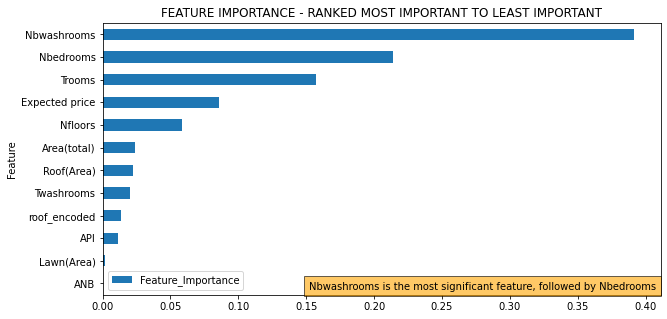

In [73]:
feature_imp.sort_values(by='Feature_Importance',ascending=True).plot(kind='barh', figsize=(10,5))
plt.title('FEATURE IMPORTANCE - RANKED MOST IMPORTANT TO LEAST IMPORTANT')
plt.figtext(0.412, 0.14, 'Nbwashrooms is the most significant feature, followed by Nbedrooms', ha="left", fontsize=10, bbox={"facecolor":"orange", "alpha":0.6, "pad":5})
plt.show()

# 5. KNN

In [74]:
clf_scores(KNeighborsClassifier())

CONFUSION MATRIX
[[ 74  18   0   0   0]
 [ 10  86  13   0   0]
 [  0   9 110   9   0]
 [  0   0  10 246   3]
 [  0   0   0   8   4]]

SCORE OF TRAIN DATA:  0.9208333333333333
SCORE OF TEST DATA:  0.8666666666666667

ACCURACY OF MODEL: 0.8666666666666667
RECALL/SENSITIVITY OF MODEL: 0.8667
F1 SCORE OF MODEL: 0.8648
PRECISION OF MODEL: 0.865


## Hyperparameter tuning

In [75]:
k_vals = [3,5,7,10,12,15,20]

In [76]:

for k in k_vals:
    clf = KNeighborsClassifier(n_neighbors=k,p=1) #using manhattan distance
    clf.fit(X_train, y_train)
    clf_train = clf.score(X_train, y_train)
    clf_test = clf.score(X_test, y_test)
    print(f'\033[1;3mfor k={k}\033[0m')
    print('train score:',clf_train)
    print('test score:', clf_test)
    print('train - test', round(abs(clf_train-clf_test),5))
    print()


for k=3
train score: 0.9420833333333334
test score: 0.8766666666666667
train - test 0.06542

for k=5
train score: 0.9316666666666666
test score: 0.9
train - test 0.03167

for k=7
train score: 0.92
test score: 0.8933333333333333
train - test 0.02667

for k=10
train score: 0.9158333333333334
test score: 0.8983333333333333
train - test 0.0175

for k=12
train score: 0.9158333333333334
test score: 0.9
train - test 0.01583

for k=15
train score: 0.9175
test score: 0.8983333333333333
train - test 0.01917

for k=20
train score: 0.9116666666666666
test score: 0.89
train - test 0.02167



Best K value: k=15 and we utilise manhattan distance

# 6. SVC 


In [77]:
clf_scores(SVC()) #Regularization parameter. The strength of the regularization is inversely proportional to C. 


CONFUSION MATRIX
[[ 83   9   0   0   0]
 [  3 104   2   0   0]
 [  0   7 117   4   0]
 [  0   0   4 253   2]
 [  0   0   0   6   6]]

SCORE OF TRAIN DATA:  0.9670833333333333
SCORE OF TEST DATA:  0.9383333333333334

ACCURACY OF MODEL: 0.9383333333333334
RECALL/SENSITIVITY OF MODEL: 0.9383
F1 SCORE OF MODEL: 0.9373
PRECISION OF MODEL: 0.9386


In [78]:
svc_params = {'C':[2,3,4,5,7,8,10,15,20,100]}

grid_svc = GridSearchCV(SVC(), param_grid=svc_params,cv=cv, n_jobs=-1,verbose=1)

In [79]:
grid_svc.fit(X_train, y_train)

Fitting 7 folds for each of 10 candidates, totalling 70 fits


GridSearchCV(cv=StratifiedKFold(n_splits=7, random_state=None, shuffle=True),
             estimator=SVC(), n_jobs=-1,
             param_grid={'C': [2, 3, 4, 5, 7, 8, 10, 15, 20, 100]}, verbose=1)

In [80]:
grid_svc.best_params_

{'C': 100}

In [81]:
grid_svc.best_score_

0.9450022042472556

# 7. Adaboost

In [82]:
clf_scores(AdaBoostClassifier())

CONFUSION MATRIX
[[  0  92   0   0   0]
 [  0 100   9   0   0]
 [  0  28  51  49   0]
 [  0   0   2 190  67]
 [  0   0   0   3   9]]

SCORE OF TRAIN DATA:  0.5891666666666666
SCORE OF TEST DATA:  0.5833333333333334

ACCURACY OF MODEL: 0.5833333333333334
RECALL/SENSITIVITY OF MODEL: 0.5833
F1 SCORE OF MODEL: 0.5565
PRECISION OF MODEL: 0.5993


In [83]:
# With base estimator as logistic Regression

In [84]:
clf_scores(AdaBoostClassifier(base_estimator=LogisticRegression()))

CONFUSION MATRIX
[[  3  89   0   0   0]
 [  0  89  20   0   0]
 [  0   0 125   3   0]
 [  0   0  19 240   0]
 [  0   0   0  12   0]]

SCORE OF TRAIN DATA:  0.7758333333333334
SCORE OF TEST DATA:  0.7616666666666667

ACCURACY OF MODEL: 0.7616666666666667
RECALL/SENSITIVITY OF MODEL: 0.7617
F1 SCORE OF MODEL: 0.7081
PRECISION OF MODEL: 0.813


In [85]:
# With base estimator as Random Forests

In [86]:
clf_scores(AdaBoostClassifier(base_estimator=RandomForestClassifier(n_estimators=60, random_state=42)))

CONFUSION MATRIX
[[ 79  13   0   0   0]
 [  6  96   7   0   0]
 [  0   4 118   6   0]
 [  0   0   5 253   1]
 [  0   0   0   8   4]]

SCORE OF TRAIN DATA:  1.0
SCORE OF TEST DATA:  0.9166666666666666

ACCURACY OF MODEL: 0.9166666666666666
RECALL/SENSITIVITY OF MODEL: 0.9167
F1 SCORE OF MODEL: 0.9138
PRECISION OF MODEL: 0.9155


# 8. Stacking

In [87]:
def get_stacking():
    level0 = []
    level0.append(('lr', LogisticRegression(C= 5, penalty='l2',solver='saga')))
    level0.append(('dt', DecisionTreeClassifier(max_depth=8, max_leaf_nodes=25, min_samples_split=5)))
    level0.append(('rf', RandomForestClassifier(max_depth=5, min_samples_leaf=5, n_estimators=2)))
    level0.append(('nb',GaussianNB()))
    level0.append(('svc', SVC(C=7)))
    level0.append(('knn',KNeighborsClassifier(n_neighbors=5,p=1)))
    print(level0)
    level1 = LogisticRegression()
    model = StackingClassifier(estimators = level0, final_estimator=level1, cv=5)
    return model

In [88]:
model_stack= get_stacking()

model_stack.fit(X_train, y_train)

[('lr', LogisticRegression(C=5, solver='saga')), ('dt', DecisionTreeClassifier(max_depth=8, max_leaf_nodes=25, min_samples_split=5)), ('rf', RandomForestClassifier(max_depth=5, min_samples_leaf=5, n_estimators=2)), ('nb', GaussianNB()), ('svc', SVC(C=7)), ('knn', KNeighborsClassifier(p=1))]


StackingClassifier(cv=5,
                   estimators=[('lr', LogisticRegression(C=5, solver='saga')),
                               ('dt',
                                DecisionTreeClassifier(max_depth=8,
                                                       max_leaf_nodes=25,
                                                       min_samples_split=5)),
                               ('rf',
                                RandomForestClassifier(max_depth=5,
                                                       min_samples_leaf=5,
                                                       n_estimators=2)),
                               ('nb', GaussianNB()), ('svc', SVC(C=7)),
                               ('knn', KNeighborsClassifier(p=1))],
                   final_estimator=LogisticRegression())

In [89]:
clf_scores(model_stack)

CONFUSION MATRIX
[[ 90   2   0   0   0]
 [  1 107   1   0   0]
 [  0   3 122   3   0]
 [  0   0   3 254   2]
 [  0   0   0   5   7]]

SCORE OF TRAIN DATA:  0.9841666666666666
SCORE OF TEST DATA:  0.9666666666666667

ACCURACY OF MODEL: 0.9666666666666667
RECALL/SENSITIVITY OF MODEL: 0.9667
F1 SCORE OF MODEL: 0.9659
PRECISION OF MODEL: 0.9658


In [90]:
splits=[2,3, 4, 5,6,7,8, 9, 10,15,20,25,50]
for i in splits:
    cv = StratifiedKFold(n_splits=i,shuffle=True, random_state=None)
    print('Number of splits:', i)
    lr_score = cross_val_score(get_stacking(),X_train, y_train, cv=cv, scoring='accuracy', n_jobs=-1)
    print('Mean accuracy:', lr_score.mean())
    print('Standard deviation(should be low):', lr_score.std())
    print('------------')

Number of splits: 2
[('lr', LogisticRegression(C=5, solver='saga')), ('dt', DecisionTreeClassifier(max_depth=8, max_leaf_nodes=25, min_samples_split=5)), ('rf', RandomForestClassifier(max_depth=5, min_samples_leaf=5, n_estimators=2)), ('nb', GaussianNB()), ('svc', SVC(C=7)), ('knn', KNeighborsClassifier(p=1))]
Mean accuracy: 0.9516666666666667
Standard deviation(should be low): 0.0008333333333333526
------------
Number of splits: 3
[('lr', LogisticRegression(C=5, solver='saga')), ('dt', DecisionTreeClassifier(max_depth=8, max_leaf_nodes=25, min_samples_split=5)), ('rf', RandomForestClassifier(max_depth=5, min_samples_leaf=5, n_estimators=2)), ('nb', GaussianNB()), ('svc', SVC(C=7)), ('knn', KNeighborsClassifier(p=1))]
Mean accuracy: 0.9604166666666667
Standard deviation(should be low): 0.004249182927993998
------------
Number of splits: 4
[('lr', LogisticRegression(C=5, solver='saga')), ('dt', DecisionTreeClassifier(max_depth=8, max_leaf_nodes=25, min_samples_split=5)), ('rf', RandomFo

# 9. XGBoost Classifier

In [91]:
xg_model = XGBClassifier()

In [92]:
xg_model.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_bin=256, max_cat_threshold=64, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, objective='multi:softprob',
              predictor='auto', ...)

In [93]:
clf_scores(xg_model)

CONFUSION MATRIX
[[ 82  10   0   0   0]
 [  5 100   4   0   0]
 [  0   6 116   6   0]
 [  0   0   5 252   2]
 [  0   0   0   6   6]]

SCORE OF TRAIN DATA:  1.0
SCORE OF TEST DATA:  0.9266666666666666

ACCURACY OF MODEL: 0.9266666666666666
RECALL/SENSITIVITY OF MODEL: 0.9267
F1 SCORE OF MODEL: 0.9256
PRECISION OF MODEL: 0.9261


In [94]:
xg_model.score(X_test, y_test)

0.9266666666666666

## Hyperparameter tuning

In [101]:
params = {'max_depth': [4,5,9,12],
         'subsample':[0.4,0.5,1],
         "n_estimators": (5,10,15,20),
         "learning_rate": (0.25,0.3,0.33,0.5)}

In [102]:
xg_grid = GridSearchCV(XGBClassifier(), param_grid=params, cv=cv,scoring='f1', verbose=1, n_jobs=-1)

In [103]:
xg_grid.fit(X_train, y_train)

Fitting 50 folds for each of 192 candidates, totalling 9600 fits


GridSearchCV(cv=StratifiedKFold(n_splits=50, random_state=None, shuffle=True),
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance_...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=None, ...),
             n_jobs=-1,
             param_grid={'learning_rate': (0.25, 0.3, 0.33, 0.5),
                         'max_depth': [4, 5, 9, 12],
                         'n_estimators': (5, 10, 15, 20),
                         'subsample': [0.4, 0.5, 1]},
             scoring='f1', verbose=1)

In [104]:
xg_grid.best_params_

{'learning_rate': 0.25, 'max_depth': 4, 'n_estimators': 5, 'subsample': 0.4}

In [105]:
xg_model1 = XGBClassifier(learning_rate=0.3, max_depth=4, n_estimators=9, subsample=0.4)

In [106]:
xg_model1.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.3, max_bin=256,
              max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
              max_depth=4, max_leaves=0, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=9, n_jobs=0,
              num_parallel_tree=1, objective='multi:softprob', predictor='auto', ...)

In [107]:
xg_model1.score(X_train, y_train)

0.88125

In [108]:
xg_model1.score(X_test, y_test)

0.8766666666666667

# VISUALISING F1 SCORES BEFORE TUNING

In [109]:
scores_before_tuning = pd.DataFrame([('Logistic Regression', 0.9421),
                       ('Naive Bayes', 0.8011),
                       ('Decision Tree Classifier',0.856),
                       ('Random Forest Classifier',0.9041),
                       ('KNN Classifier', 0.8492),
                       ('SVC',0.9475),
                       ('Adaboost Classifier', 0.5565),
                       ('Stacking Classifier', 0.9509),
                       ('XGBoost Classifier',0.9229)], columns=['Estimator','F1'])

In [110]:
scores_before_tuning.sort_values(by='F1', ascending=False, inplace=True)

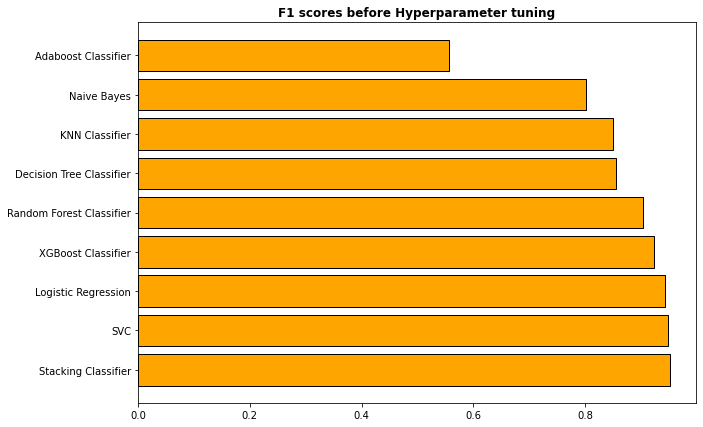

In [111]:
plt.figure(figsize=(10,7))
plt.barh(width = scores_before_tuning['F1'], y = scores_before_tuning['Estimator'], color='orange', edgecolor='black')
plt.title('F1 scores before Hyperparameter tuning', fontweight='bold')
plt.show()

# Inference: 
Stacking classifier and SVC prove to be the best models while Adaboost classifier is the poorest performer before hyperparameter tuning

# <font color='grey'> PIPELINE CREATION

# Logistic Regression

In [112]:
#steps for pipeline
steps = ([('scaler',StandardScaler()),
                  ('classifier', LogisticRegression(C= 5, penalty='l2',solver='saga'))])

In [113]:
#visualising the steps involved in our pipeline
pipe_lr = Pipeline(steps); pipe_lr

Pipeline(steps=[('scaler', StandardScaler()),
                ('classifier', LogisticRegression(C=5, solver='saga'))])

# Gaussian Naive Bayes

In [114]:
steps = ([('scaler',StandardScaler()),
                  ('classifier', GaussianNB())])

In [115]:
pipe_nb = Pipeline(steps); pipe_nb

Pipeline(steps=[('scaler', StandardScaler()), ('classifier', GaussianNB())])

# KNN


In [116]:
steps = ([('scaler', StandardScaler()),
          ('classifier', KNeighborsClassifier(n_neighbors=15,p=1))])

pipe_knn = Pipeline(steps); pipe_knn

Pipeline(steps=[('scaler', StandardScaler()),
                ('classifier', KNeighborsClassifier(n_neighbors=15, p=1))])

# Decision Tree Classifier 

In [117]:
steps = ([('classifier', DecisionTreeClassifier(max_depth=8, max_leaf_nodes=25, min_samples_split=5))])

In [118]:
pipe_dt = Pipeline(steps); pipe_dt

Pipeline(steps=[('classifier',
                 DecisionTreeClassifier(max_depth=8, max_leaf_nodes=25,
                                        min_samples_split=5))])

# Random Forest Classifier

In [119]:
steps = ([('classifier',RandomForestClassifier(max_depth=5, min_samples_leaf=5, n_estimators=2))])

In [120]:
params = {'classifier__max_depth': [2,5,10,20, 25,50,60,80],
                 'classifier__n_estimators': [2,3,4, 5,7,9,20],
                 'classifier__min_samples_leaf': [5,10,15, 20,50]}

In [121]:
pipe_rf = Pipeline(steps); pipe_rf

Pipeline(steps=[('classifier',
                 RandomForestClassifier(max_depth=5, min_samples_leaf=5,
                                        n_estimators=2))])

In [122]:
rf_grid = GridSearchCV(pipe_rf, params).fit(X_train ,y_train)

In [123]:
rf_grid.best_estimator_

Pipeline(steps=[('classifier',
                 RandomForestClassifier(max_depth=25, min_samples_leaf=5,
                                        n_estimators=20))])

In [124]:
rf_grid.best_score_

0.8787499999999999

In [125]:
rf_grid.best_estimator_

Pipeline(steps=[('classifier',
                 RandomForestClassifier(max_depth=25, min_samples_leaf=5,
                                        n_estimators=20))])

# SVC

In [126]:
steps = ([('scaling', StandardScaler()),
         ('SVC', SVC(C=4))])

In [127]:
pipe_svc = Pipeline(steps); pipe_svc

Pipeline(steps=[('scaling', StandardScaler()), ('SVC', SVC(C=4))])

# XGBoost Classifier

In [128]:
pipe_xg = Pipeline([('scaler', StandardScaler()),
                        ('xgboost', XGBClassifier(learning_rate=0.3, max_depth=4, n_estimators=9, subsample=0.4))])

pipe_xg

Pipeline(steps=[('scaler', StandardScaler()),
                ('xgboost',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy=None, importance_type=None,
                               interaction_constraints=None, learning_rate=0.3,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=4, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, n_estimators=9,
                               n_jobs=None, num_parallel_tree=None,
                               predictor=None, random_state=None, ...))])

# Adaboost Classifier

In [129]:
pipe_ada = Pipeline([('scaler', StandardScaler()),
                         ('adaboost',AdaBoostClassifier(base_estimator=RandomForestClassifier(max_depth=5, min_samples_leaf=5, n_estimators=2, random_state=42)))])

pipe_ada

Pipeline(steps=[('scaler', StandardScaler()),
                ('adaboost',
                 AdaBoostClassifier(base_estimator=RandomForestClassifier(max_depth=5,
                                                                          min_samples_leaf=5,
                                                                          n_estimators=2,
                                                                          random_state=42)))])

# Stacking Classifier

In [130]:
pipe_stack = Pipeline([('scaler', StandardScaler()),
                         ('stacking_regressor',get_stacking())]); 
pipe_stack

[('lr', LogisticRegression(C=5, solver='saga')), ('dt', DecisionTreeClassifier(max_depth=8, max_leaf_nodes=25, min_samples_split=5)), ('rf', RandomForestClassifier(max_depth=5, min_samples_leaf=5, n_estimators=2)), ('nb', GaussianNB()), ('svc', SVC(C=7)), ('knn', KNeighborsClassifier(p=1))]


Pipeline(steps=[('scaler', StandardScaler()),
                ('stacking_regressor',
                 StackingClassifier(cv=5,
                                    estimators=[('lr',
                                                 LogisticRegression(C=5,
                                                                    solver='saga')),
                                                ('dt',
                                                 DecisionTreeClassifier(max_depth=8,
                                                                        max_leaf_nodes=25,
                                                                        min_samples_split=5)),
                                                ('rf',
                                                 RandomForestClassifier(max_depth=5,
                                                                        min_samples_leaf=5,
                                                                        n_estimators=2)),
                                                ('nb', GaussianNB()),
                                                ('svc', SVC(C=7)),
                                                ('knn',
                                                 KNeighborsClassifier(p=1))],
                                    final_estimator=LogisticRegression()))])

In [131]:
#Combining pipelines in a list
pipelines = [pipe_lr,pipe_nb,pipe_knn, pipe_dt, pipe_rf, pipe_svc, pipe_xg, pipe_ada, pipe_stack]; pipelines

[Pipeline(steps=[('scaler', StandardScaler()),
                 ('classifier', LogisticRegression(C=5, solver='saga'))]),
 Pipeline(steps=[('scaler', StandardScaler()), ('classifier', GaussianNB())]),
 Pipeline(steps=[('scaler', StandardScaler()),
                 ('classifier', KNeighborsClassifier(n_neighbors=15, p=1))]),
 Pipeline(steps=[('classifier',
                  DecisionTreeClassifier(max_depth=8, max_leaf_nodes=25,
                                         min_samples_split=5))]),
 Pipeline(steps=[('classifier',
                  RandomForestClassifier(max_depth=5, min_samples_leaf=5,
                                         n_estimators=2))]),
 Pipeline(steps=[('scaling', StandardScaler()), ('SVC', SVC(C=4))]),
 Pipeline(steps=[('scaler', StandardScaler()),
                 ('xgboost',
                  XGBClassifier(base_score=None, booster=None, callbacks=None,
                                colsample_bylevel=None, colsample_bynode=None,
                                c

In [132]:
best_accuracy=0.0
best_classifier=0
best_pipeline=''

In [133]:
pipe_dict = {0:'Logistic Regression', 
             1: 'Gaussian Naive Bayes',
             2:'KNN Classifier',
             3:'Decision Tree Classifier', 
             4:'Random Forest Classifier', 
             5:'SVC', 
             6:'XGBoost Classifier', 
             7:'Adaboost Classifier', 
             8:'Stacking Classifier'}; 
pipe_dict

{0: 'Logistic Regression',
 1: 'Gaussian Naive Bayes',
 2: 'KNN Classifier',
 3: 'Decision Tree Classifier',
 4: 'Random Forest Classifier',
 5: 'SVC',
 6: 'XGBoost Classifier',
 7: 'Adaboost Classifier',
 8: 'Stacking Classifier'}

# Fitting the pipelines and the model

In [134]:
# Performs fit_transform on x_train, and transform on x_test

for pipe in pipelines:
    pipe.fit(X_train, y_train)

# Capturing train score of each model

In [135]:
train_score=[]
print('\033[1;3mModel Evaluation: Train Accuracy\n\033[0m')
for index, model in enumerate(pipelines):
    print("{} Train Score = {}".format(pipe_dict[index], round(model.score(X_train, y_train),4)))
    
    train_score.append(model.score(X_train, y_train))

Model Evaluation: Train Accuracy

Logistic Regression Train Score = 0.9725
Gaussian Naive Bayes Train Score = 0.8025
KNN Classifier Train Score = 0.9175
Decision Tree Classifier Train Score = 0.8504
Random Forest Classifier Train Score = 0.8212
SVC Train Score = 0.9862
XGBoost Classifier Train Score = 0.8812
Adaboost Classifier Train Score = 0.8996
Stacking Classifier Train Score = 0.9842


# Capturing test score of each model

In [136]:
test_score =[]
print('\033[1;3mModel Evaluation: Test Accuracy\n\033[0m')
for index, model in enumerate(pipelines):
    y_pred = model.predict(X_test)
    print("{} Test Score = {}".format(pipe_dict[index], round(model.score(X_test, y_test),4)))
    test_score.append(model.score(X_test, y_test))

Model Evaluation: Test Accuracy

Logistic Regression Test Score = 0.95
Gaussian Naive Bayes Test Score = 0.795
KNN Classifier Test Score = 0.8983
Decision Tree Classifier Test Score = 0.8633
Random Forest Classifier Test Score = 0.8417
SVC Test Score = 0.9483
XGBoost Classifier Test Score = 0.8767
Adaboost Classifier Test Score = 0.8483
Stacking Classifier Test Score = 0.965


# Capturing f1 score of each model

In [137]:
f1_scores = []
print('\033[1;3mModel Evaluation: F1 Score\n\033[0m')
for index, model in enumerate(pipelines):
    y_pred = model.predict(X_test)
    print("{} F1 Score = {}".format(pipe_dict[index], round(f1_score(y_test, y_pred, average='weighted'),4)))
    f1_scores.append(f1_score(y_test, y_pred,average='weighted'))

Model Evaluation: F1 Score

Logistic Regression F1 Score = 0.9492
Gaussian Naive Bayes F1 Score = 0.801
KNN Classifier F1 Score = 0.8959
Decision Tree Classifier F1 Score = 0.8551
Random Forest Classifier F1 Score = 0.8323
SVC F1 Score = 0.9482
XGBoost Classifier F1 Score = 0.8736
Adaboost Classifier F1 Score = 0.8419
Stacking Classifier F1 Score = 0.9642


# Capturing accuracy score of each model

In [138]:
accuracy_scores = []
print('\033[1;3mModel Evaluation: Accuracy Score\n\033[0m')
for index, model in enumerate(pipelines):
    y_pred = model.predict(X_test)
    print("{} Accuracy Score = {}".format(pipe_dict[index], round(accuracy_score(y_test, y_pred),4)))
    accuracy_scores.append(f1_score(y_test, y_pred,average='weighted'))

Model Evaluation: Accuracy Score

Logistic Regression Accuracy Score = 0.95
Gaussian Naive Bayes Accuracy Score = 0.795
KNN Classifier Accuracy Score = 0.8983
Decision Tree Classifier Accuracy Score = 0.8633
Random Forest Classifier Accuracy Score = 0.8417
SVC Accuracy Score = 0.9483
XGBoost Classifier Accuracy Score = 0.8767
Adaboost Classifier Accuracy Score = 0.8483
Stacking Classifier Accuracy Score = 0.965


# Capturing precision score of each model

In [139]:
prec_scores = []
print('\033[1;3mModel Evaluation: Precision Score\n\033[0m')
for index, model in enumerate(pipelines):
    y_pred = model.predict(X_test)
    print("{} F1 Score = {}".format(pipe_dict[index], round(precision_score(y_test, y_pred, average='weighted'),4)))
    prec_scores.append(f1_score(y_test, y_pred,average='weighted'))

Model Evaluation: Precision Score

Logistic Regression F1 Score = 0.9496
Gaussian Naive Bayes F1 Score = 0.8132
KNN Classifier F1 Score = 0.8959
Decision Tree Classifier F1 Score = 0.85
Random Forest Classifier F1 Score = 0.8306
SVC F1 Score = 0.9484
XGBoost Classifier F1 Score = 0.8804
Adaboost Classifier F1 Score = 0.8655
Stacking Classifier F1 Score = 0.9642


# Capturing recall score of each model

In [140]:
rec_scores = []
print('\033[1;3mModel Evaluation: Recall Score\n\033[0m')
for index, model in enumerate(pipelines):
    y_pred = model.predict(X_test)
    print("{} F1 Score = {}".format(pipe_dict[index], round(recall_score(y_test, y_pred, average='weighted'),4)))
    rec_scores.append(f1_score(y_test, y_pred,average='weighted'))

Model Evaluation: Recall Score

Logistic Regression F1 Score = 0.95
Gaussian Naive Bayes F1 Score = 0.795
KNN Classifier F1 Score = 0.8983
Decision Tree Classifier F1 Score = 0.8633
Random Forest Classifier F1 Score = 0.8417
SVC F1 Score = 0.9483
XGBoost Classifier F1 Score = 0.8767
Adaboost Classifier F1 Score = 0.8483
Stacking Classifier F1 Score = 0.965


# Tabulation all Performance Metrics

In [141]:
final_df = pd.DataFrame(zip(pipe_dict.values(), train_score, test_score, f1_scores, accuracy_scores, prec_scores, rec_scores),
                        columns=['Classifier', 'Train Score', 'Test Score','F1 Score', 'Accuracy Score', 'Precision Scores', 'Recall Scores'])

In [142]:
final_df.sort_values(by='F1 Score', ascending=False, inplace=True)

In [143]:
final_df.set_index('Classifier', inplace=True)

In [144]:
final_df['Variance']= abs(final_df['Train Score'] - final_df['Test Score'])

In [145]:
final_df.to_csv('Model Comparison')

In [146]:
final_df

,Train Score,Test Score,F1 Score,Accuracy Score,Precision Scores,Recall Scores,Variance
Classifier,,,,,,,
Stacking Classifier,0.984167,0.965000,0.964248,0.964248,0.964248,0.964248,0.019167
Logistic Regression,0.972500,0.950000,0.949165,0.949165,0.949165,0.949165,0.022500
SVC,0.986250,0.948333,0.948201,0.948201,0.948201,0.948201,0.037917
KNN Classifier,0.917500,0.898333,0.895945,0.895945,0.895945,0.895945,0.019167
XGBoost Classifier,0.881250,0.876667,0.873592,0.873592,0.873592,0.873592,0.004583
Decision Tree Classifier,0.850417,0.863333,0.855058,0.855058,0.855058,0.855058,0.012917
Adaboost Classifier,0.899583,0.848333,0.841950,0.841950,0.841950,0.841950,0.051250
Random Forest Classifier,0.821250,0.841667,0.832315,0.832315,0.832315,0.832315,0.020417
Gaussian Naive Bayes,0.802500,0.795000,0.800970,0.800970,0.800970,0.800970,0.007500


In [147]:
final_df.to_csv('final_scores.csv')

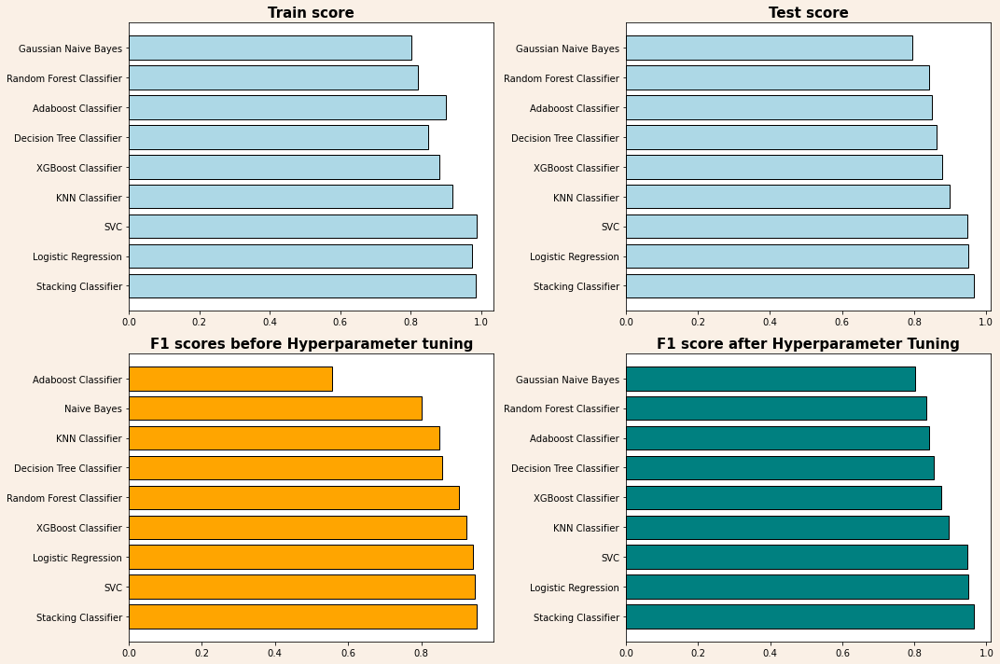

In [148]:
fig, ((ax1,ax2),(ax3,ax4)) = plt.subplots(2,2, figsize=(15,10), facecolor='linen')

ax1.barh(width=final_df['Train Score'], y = final_df.index, color='lightblue',edgecolor='black')
ax1.set_title('Train score', fontweight='bold', size=15)

ax2.barh(width=final_df['Test Score'], y = final_df.index, color='lightblue', edgecolor='black')
ax2.set_title('Test score', fontweight='bold', size=15)

ax3.barh(width = scores_before_tuning['F1'], y = scores_before_tuning['Estimator'], color='orange', edgecolor='black')
ax3.set_title('F1 scores before Hyperparameter tuning', fontweight='bold', size=15)

ax4.barh(width=final_df['F1 Score'], y = final_df.index, color='teal', edgecolor='black')
ax4.set_title('F1 score after Hyperparameter Tuning', fontweight='bold', size=15)


plt.tight_layout()

In [149]:
print('Model with Highest F1 Score:', final_df['F1 Score'].idxmax())

Model with Highest F1 Score: Stacking Classifier


In [150]:
print('Model with Highest Accuracy Score:', final_df['Accuracy Score'].idxmax())

Model with Highest Accuracy Score: Stacking Classifier


# BUILDING BEST MODEL TO COMPARE WITH ACTUAL DATA

In [151]:
stacking_model = get_stacking()

[('lr', LogisticRegression(C=5, solver='saga')), ('dt', DecisionTreeClassifier(max_depth=8, max_leaf_nodes=25, min_samples_split=5)), ('rf', RandomForestClassifier(max_depth=5, min_samples_leaf=5, n_estimators=2)), ('nb', GaussianNB()), ('svc', SVC(C=7)), ('knn', KNeighborsClassifier(p=1))]


In [152]:
stacking_model.fit(X_train,y_train)

StackingClassifier(cv=5,
                   estimators=[('lr', LogisticRegression(C=5, solver='saga')),
                               ('dt',
                                DecisionTreeClassifier(max_depth=8,
                                                       max_leaf_nodes=25,
                                                       min_samples_split=5)),
                               ('rf',
                                RandomForestClassifier(max_depth=5,
                                                       min_samples_leaf=5,
                                                       n_estimators=2)),
                               ('nb', GaussianNB()), ('svc', SVC(C=7)),
                               ('knn', KNeighborsClassifier(p=1))],
                   final_estimator=LogisticRegression())

In [153]:
stacking_model.score(X_train, y_train)

0.9833333333333333

In [154]:
stacking_model.score(X_test, y_test)

0.965

# COMPARING ACTUAL CLASSES WITH PREDICTED CLASSES

In [155]:
stacking_pred= pd.DataFrame(stacking_model.predict(X_test)).value_counts()

In [156]:
y_test_pred = pd.DataFrame(y_test.value_counts(), index = y_test.value_counts().index)

In [157]:
y_test_pred

,Grade_encoded
3,259
2,128
1,109
0,92
4,12


In [158]:
stacking_pred

3    262
2    125
1    113
0     91
4      9
dtype: int64

# Generating classification_report

In [159]:
from sklearn.metrics import classification_report

In [160]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.99      0.98      0.98        92
           1       0.95      0.99      0.97       109
           2       0.96      0.95      0.96       128
           3       0.97      0.97      0.97       259
           4       0.78      0.58      0.67        12

    accuracy                           0.96       600
   macro avg       0.93      0.90      0.91       600
weighted avg       0.96      0.96      0.96       600



In [161]:
stacking_pred_grades = pd.DataFrame(stacking_pred)
stacking_pred_grades.columns = ['Stacking Prediction Distribution']

In [162]:
stacking_pred_grades.index= [3,2,1,0,4]

In [163]:
final_comp  = pd.concat([y_test_pred,stacking_pred_grades], axis=1)

In [164]:
final_comp

,Grade_encoded,Stacking Prediction Distribution
3,259,262
2,128,125
1,109,113
0,92,91
4,12,9


# <div class='alert alert-success'><center> Conclusion



From the above, we can conclude that the stacking classifier outperforms all other models in terms of its f1 score and accuracy score

# <div class='alert alert-success'><center> Business Insights

**For realtors and property owners to make data-driven decisions, the following must be considered:** 

- The area of a house is crucial to determine the grade of the home. If a house has a larger area, it is more likely to have a higher grade and hence, be more valuable. 


- Homes that have more number of rooms, washrooms and floors will have a higher grade and be more valuable in the real estate market.


- Property Owners can focus on increasing the house dimensions to improve their house grade in order to maximize profits.
 
 
- The analysis indicates that homes with lowest grades tend to have the lowest API, this could imply that these houses are far from industrial and metropolitan cities where pollution tends to be higher. To get a higher grade, the realtor must be ready to compromise on this factor and expect higher prices in industrial and metropolitan regions.


- The property owners can use the above insights to increase customer demand through data driven decisions on the home valuation.


---